# Wavelet Before Feature Engineering vs. After vs. Baseline

In [1]:
import os
import glob
import pandas as pd
import numpy as np
csv_files = glob.glob('data/predictions/*.csv')



In [2]:
def cal_mse(original_test_data, predictions):
 
    mse_high_bid = np.mean((original_test_data['high_bid'] - predictions['high_bid']) ** 2)
    mse_low_ask = np.mean((original_test_data['low_ask'] - predictions['low_ask']) ** 2)
    
    return (mse_high_bid, mse_low_ask)

In [3]:
def cal_accuracy(original_test_data, predictions):
    high_bid_accuracy = (original_test_data['high_bid']>predictions['high_bid']).mean()*100
    low_ask_accuracy = (original_test_data['low_ask']>predictions['low_ask']).mean()*100
    return (high_bid_accuracy,low_ask_accuracy)

In [4]:
suffixes = ['with_MLPAE', 'arima_baseline', 'wavelet_before_fe', 'wavelet_after_fe']

def go_through_models(suffix, csv_files,evaluation):
    evaluation_values = {}
    for suffix in suffixes:
        
        original_test_data_file = next((file for file in csv_files if f'original_test_data_{suffix}' in file), None)
        predictions_file = next((file for file in csv_files if f'predictions_{suffix}' in file), None)

        if original_test_data_file and predictions_file:
            
            original_test_data = pd.read_csv(original_test_data_file, index_col='Unnamed: 0', parse_dates=True)
            
            predictions = pd.read_csv(predictions_file, index_col='Unnamed: 0', parse_dates=True)
            
            
            evaluation_value = evaluation(original_test_data, predictions)
            
            
            evaluation_values[suffix] = evaluation_value
    return evaluation_values



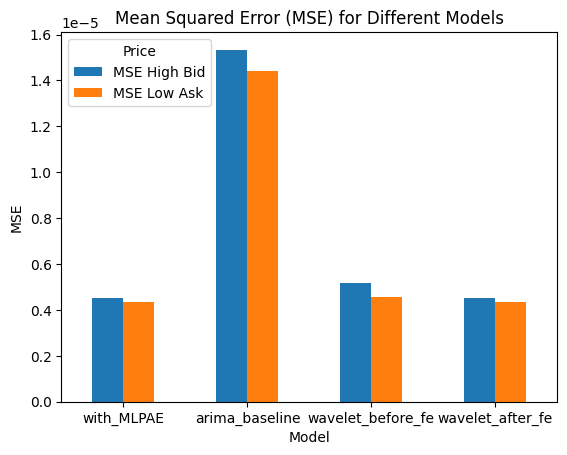

In [5]:
import matplotlib.pyplot as plt
suffixes = ['with_MLPAE', 'arima_baseline', 'wavelet_before_fe', 'wavelet_after_fe']
evaluation_values=go_through_models(suffixes,csv_files,cal_mse)

evaluation_df = pd.DataFrame.from_dict(evaluation_values, orient='index', columns=['MSE High Bid', 'MSE Low Ask'])


evaluation_df.plot(kind='bar', rot=0)
plt.xlabel('Model')
plt.ylabel('MSE')
plt.title('Mean Squared Error (MSE) for Different Models')
plt.legend(title='Price', loc='upper left')
plt.show()

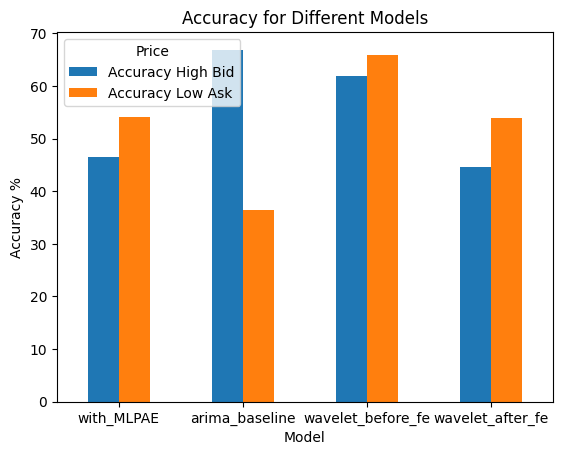

In [6]:
evaluation_values=go_through_models(suffixes,csv_files,cal_accuracy)

evaluation_df = pd.DataFrame.from_dict(evaluation_values, orient='index', columns=['Accuracy High Bid', 'Accuracy Low Ask'])


evaluation_df.plot(kind='bar', rot=0)
plt.xlabel('Model')
plt.ylabel('Accuracy %')
plt.title('Accuracy for Different Models')
plt.legend(title='Price', loc='upper left')
plt.show()

In [7]:
csv_files

['data/predictions/original_test_data_with_MLPAE.csv',
 'data/predictions/predictions_arima_baseline.csv',
 'data/predictions/predictions_wavelet_before_fe.csv',
 'data/predictions/original_test_data_wavelet_before_fe.csv',
 'data/predictions/predictions_with_MLPAE.csv',
 'data/predictions/original_test_data_arima_baseline.csv',
 'data/predictions/original_test_data_wavelet_after_fe.csv',
 'data/predictions/predictions_wavelet_after_fe.csv']

In [8]:
pd.read_csv('data/predictions/predictions_arima_baseline.csv')

,Unnamed: 0,high_bid_change_rate_target,low_ask_change_rate_target,last_open_ask,last_open_bid,high_bid,low_ask
0,2022-09-06 01:00:00,0.000000,0.000000,0.99420,0.99413,0.994200,0.994130
1,2022-09-06 02:00:00,0.000000,0.000000,0.99506,0.99501,0.995060,0.995010
2,2022-09-06 03:00:00,0.033710,-0.144294,0.99689,0.99682,0.997226,0.998258
3,2022-09-06 04:00:00,0.214005,-0.300131,0.99643,0.99640,0.998562,0.999391
4,2022-09-06 05:00:00,0.045372,-0.063355,0.99590,0.99585,0.996352,0.996481
...,...,...,...,...,...,...,...
5243,2023-07-14 00:00:00,-0.026295,0.007493,1.12239,1.12238,1.122095,1.122296
5244,2023-07-14 01:00:00,-0.012575,-0.018603,1.12250,1.12244,1.122359,1.122649
5245,2023-07-14 02:00:00,0.028266,-0.104279,1.12248,1.12244,1.122797,1.123610
5246,2023-07-14 03:00:00,-0.096830,0.044698,1.12240,1.12237,1.121313,1.121868


In [9]:
combined_df = pd.DataFrame()


original_file = 'data/predictions/original_test_data_arima_baseline.csv'
original_data = pd.read_csv(original_file, index_col='Unnamed: 0', parse_dates=True)[['high_bid','low_ask','open_ask', 'open_bid', 'close_ask', 'close_bid']]

combined_df = pd.concat([combined_df, original_data], axis=1)
for suffix in suffixes:
    
    predictions_file = f'data/predictions/predictions_{suffix}.csv'
    predictions_df = pd.read_csv(predictions_file, index_col='Unnamed: 0', parse_dates=True)[['high_bid', 'low_ask']]
    
    
    combined_df = pd.concat([combined_df, predictions_df.add_suffix(f'.{suffix}')], axis=1)


combined_df=combined_df.dropna()
combined_df

,high_bid,low_ask,open_ask,open_bid,close_ask,close_bid,high_bid.with_MLPAE,low_ask.with_MLPAE,high_bid.arima_baseline,low_ask.arima_baseline,high_bid.wavelet_before_fe,low_ask.wavelet_before_fe,high_bid.wavelet_after_fe,low_ask.wavelet_after_fe
2022-09-06 01:00:00,0.99706,0.99615,0.99689,0.99682,0.99646,0.99640,0.994837,0.993539,0.994200,0.994130,0.994437,0.993211,0.994904,0.993544
2022-09-06 02:00:00,0.99642,0.99497,0.99643,0.99640,0.99591,0.99585,0.995693,0.994415,0.995060,0.995010,0.995274,0.994034,0.995764,0.994423
2022-09-06 03:00:00,0.99589,0.99430,0.99590,0.99585,0.99444,0.99440,0.997523,0.996222,0.997226,0.998258,0.997143,0.995800,0.997595,0.996232
2022-09-06 04:00:00,0.99548,0.99443,0.99446,0.99440,0.99466,0.99461,0.997063,0.995802,0.998562,0.999391,0.996729,0.995462,0.997135,0.995812
2022-09-06 05:00:00,0.99649,0.99451,0.99467,0.99461,0.99597,0.99590,0.996550,0.995255,0.996352,0.996481,0.996172,0.994890,0.996605,0.995263
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-07-14 00:00:00,1.12280,1.12220,1.12248,1.12244,1.12241,1.12237,1.123115,1.121727,1.122095,1.122296,1.122786,1.121393,1.123184,1.121718
2023-07-14 01:00:00,1.12247,1.12136,1.12240,1.12237,1.12233,1.12229,1.123216,1.121789,1.122359,1.122649,1.122898,1.121457,1.123294,1.121778
2023-07-14 02:00:00,1.12337,1.12224,1.12232,1.12229,1.12340,1.12336,1.123192,1.121790,1.122797,1.123610,1.123078,1.121650,1.123274,1.121778
2023-07-14 03:00:00,1.12386,1.12314,1.12339,1.12336,1.12340,1.12337,1.123110,1.121722,1.121313,1.121868,1.122790,1.121367,1.123194,1.121708


In [10]:
from src.eval.forecast_features_adder import ForecastsAggergator, ForecastMetricsAdder
aggregator = ForecastsAggergator(quantiles=[0.05, 0.4, 0.5,0.6,0.95])
combined_df = aggregator.transform(combined_df)
combined_df.columns

Index(['high_bid', 'low_ask', 'open_ask', 'open_bid', 'close_ask', 'close_bid',
       'high_q5', 'high_q40', 'high_q50', 'high_q60', 'high_q95', 'low_q5',
       'low_q40', 'low_q50', 'low_q60', 'low_q95', 'high_q5_pct',
       'high_q40_pct', 'high_q50_pct', 'high_q60_pct', 'high_q95_pct',
       'high_pct', 'low_q5_pct', 'low_q40_pct', 'low_q50_pct', 'low_q60_pct',
       'low_q95_pct', 'low_pct'],
      dtype='object')

In [11]:
combined_df.reset_index(drop=False, inplace=True)


combined_df.rename(columns={'index': 'open_time'}, inplace=True)

combined_df

,open_time,high_bid,low_ask,open_ask,open_bid,close_ask,close_bid,high_q5,high_q40,high_q50,...,high_q50_pct,high_q60_pct,high_q95_pct,high_pct,low_q5_pct,low_q40_pct,low_q50_pct,low_q60_pct,low_q95_pct,low_pct
0,2022-09-06 01:00:00,0.99706,0.99615,0.99689,0.99682,0.99646,0.99640,0.994236,0.994517,0.994637,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2022-09-06 02:00:00,0.99642,0.99497,0.99643,0.99640,0.99591,0.99585,0.995092,0.995358,0.995484,...,-0.097978,-0.085346,-0.070891,-0.004014,0.231740,0.199068,0.198812,0.198555,0.148333,0.143514
2,2022-09-06 03:00:00,0.99589,0.99430,0.99590,0.99585,0.99444,0.99440,0.997156,0.997285,0.997375,...,0.147068,0.156020,0.168154,-0.002005,-0.001315,-0.037587,-0.037883,-0.038178,-0.211315,0.155648
3,2022-09-06 04:00:00,0.99548,0.99443,0.99446,0.99440,0.99466,0.99461,0.996779,0.997077,0.997099,...,0.267378,0.269555,0.393011,0.104580,-0.111962,-0.141228,-0.141532,-0.141836,-0.447885,-0.003015
4,2022-09-06 05:00:00,0.99649,0.99451,0.99467,0.99461,0.99597,0.99590,0.996199,0.996391,0.996451,...,0.180033,0.185998,0.194679,0.183981,-0.033645,-0.065029,-0.065256,-0.065483,-0.169736,0.010056
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5243,2023-07-14 00:00:00,1.12280,1.12220,1.12248,1.12244,1.12241,1.12237,1.122199,1.122852,1.122951,...,0.041021,0.049818,0.060893,0.027612,0.088932,0.064146,0.063917,0.063688,0.020439,0.021379
5244,2023-07-14 01:00:00,1.12247,1.12136,1.12240,1.12237,1.12233,1.12229,1.122440,1.122961,1.123057,...,0.057611,0.066114,0.077703,0.005342,0.077023,0.052542,0.052264,0.051985,-0.013343,0.089994
5245,2023-07-14 02:00:00,1.12337,1.12224,1.12232,1.12229,1.12340,1.12336,1.122839,1.123101,1.123135,...,0.071720,0.074754,0.083034,0.092673,0.055333,0.045387,0.045058,0.044729,-0.093330,0.004461
5246,2023-07-14 03:00:00,1.12386,1.12314,1.12339,1.12336,1.12340,1.12337,1.121535,1.122854,1.122950,...,-0.040072,-0.031531,-0.019433,0.040950,0.172845,0.146804,0.146448,0.146092,0.134750,0.019589


In [12]:
metricsadder=ForecastMetricsAdder(quantiles=[0.05, 0.4, 0.5,0.6,0.95])
metric_data=metricsadder.transform(combined_df)

metric_data.columns

Index(['open_time', 'high_q5_error', 'high_q5_abs_error', 'high_q5_pct_error',
       'high_q5_abs_pct_error', 'high_q5_accuracy', 'high_q40_error',
       'high_q40_abs_error', 'high_q40_pct_error', 'high_q40_abs_pct_error',
       'high_q40_accuracy', 'high_q50_error', 'high_q50_abs_error',
       'high_q50_pct_error', 'high_q50_abs_pct_error', 'high_q50_accuracy',
       'high_q60_error', 'high_q60_abs_error', 'high_q60_pct_error',
       'high_q60_abs_pct_error', 'high_q60_accuracy', 'high_q95_error',
       'high_q95_abs_error', 'high_q95_pct_error', 'high_q95_abs_pct_error',
       'high_q95_accuracy', 'low_q5_error', 'low_q5_abs_error',
       'low_q5_pct_error', 'low_q5_abs_pct_error', 'low_q5_accuracy',
       'low_q40_error', 'low_q40_abs_error', 'low_q40_pct_error',
       'low_q40_abs_pct_error', 'low_q40_accuracy', 'low_q50_error',
       'low_q50_abs_error', 'low_q50_pct_error', 'low_q50_abs_pct_error',
       'low_q50_accuracy', 'low_q60_error', 'low_q60_abs_error',
    

In [13]:
from src.eval.plots import *

prepare_summary_reports(metric_data)


In [14]:
metric="abs_error"
metric_data['open_time'] = pd.to_datetime(metric_data['open_time'])
metric_data.set_index('open_time', inplace=True)
metric_mean_plot(metric_data, metric, period="D")

In [15]:
for metric in ["abs_error", "accuracy"]:
 
      error_cols = [col for col in metric_data.columns if metric in col]
      print(error_cols)

['high_q5_abs_error', 'high_q40_abs_error', 'high_q50_abs_error', 'high_q60_abs_error', 'high_q95_abs_error', 'low_q5_abs_error', 'low_q40_abs_error', 'low_q50_abs_error', 'low_q60_abs_error', 'low_q95_abs_error']
['high_q5_accuracy', 'high_q40_accuracy', 'high_q50_accuracy', 'high_q60_accuracy', 'high_q95_accuracy', 'low_q5_accuracy', 'low_q40_accuracy', 'low_q50_accuracy', 'low_q60_accuracy', 'low_q95_accuracy']


In [16]:
resduial_error(metric_data, side="high")

In [17]:
combined_df.set_index('open_time', inplace=True)
plot_estimated_prices_range(combined_df, side="high", year=2023)

In [18]:
combined_df['open_avg'] = (combined_df['open_ask'] + combined_df['open_bid']) / 2
combined_df['close_avg'] = (combined_df['close_ask'] + combined_df['close_bid']) / 2
plot_candlestick(combined_df, year=2023)